In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("Hub version:", hub.__version__)
print ("GPU","available" if tf.config.list_physical_devices("GPU") else "not available:()" )

TF version: 2.17.0
Hub version: 0.16.1
GPU available


In [ ]:
## check out the labels of our data
import pandas as pd
import numpy as np
labels = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Dog_vision/labels.csv")
print(labels.describe())
print(labels.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: xlabel='breed'>

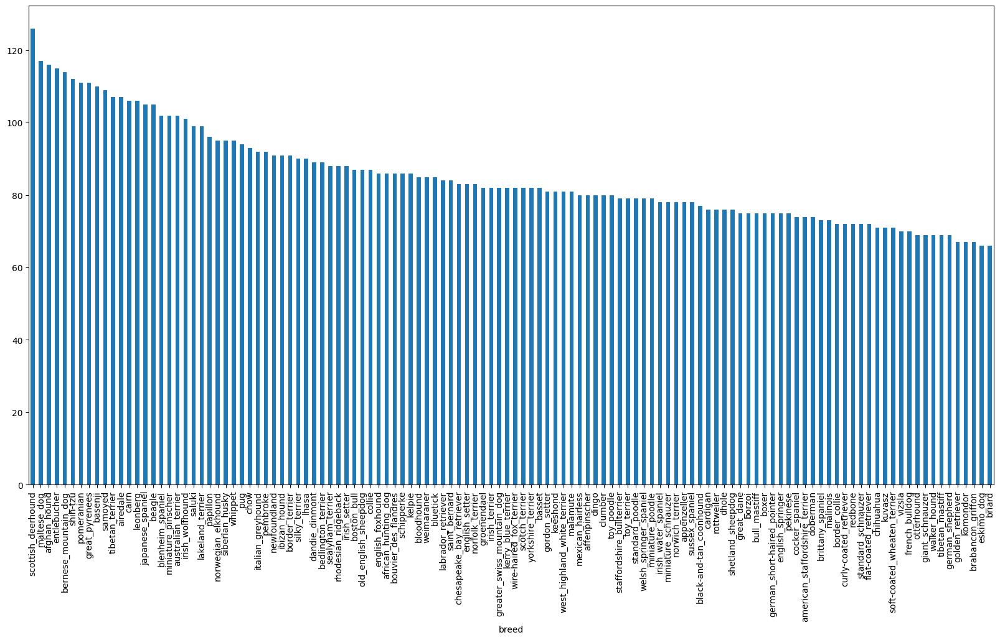

In [ ]:
labels["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
# whats the median number of images per class
labels["breed"].value_counts().median()

82.0

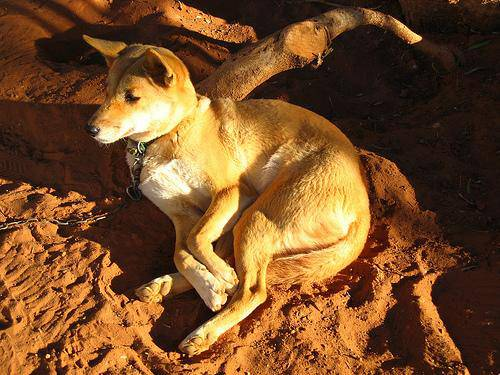

In [ ]:
# Let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/Colab Notebooks/Dog_vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

In [ ]:
# Create pathnames from image ID's
filenames = ["/content/drive/MyDrive/Colab Notebooks/Dog_vision/train/"+fname+".jpg" for fname in labels["id"]]
filenames[:10]

['/content/drive/MyDrive/Colab Notebooks/Dog_vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog_vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog_vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog_vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog_vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog_vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog_vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog_vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog_vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog_vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
os.listdir("/content/drive/MyDrive/Colab Notebooks/Dog_vision/train/")[:10]

['e7bc17ef352ef576b73467ebe9a407f1.jpg',
 'e79a196a6e1772b9fa6b008b597d3a08.jpg',
 'e79011daac807552f798aa1effb60ee4.jpg',
 'e80dbb78fb1d763d01d73b2f367c6805.jpg',
 'e818d5a7782350e72171c3dfa05af02a.jpg',
 'e82a61cd6a3285ab9bba11fc8d752fa9.jpg',
 'e7af30693df78697b8541fb5e2e46941.jpg',
 'e86acb593c6718489134a45e8b936b90.jpg',
 'e8057e2f1e3bca4e9f4a2af48a9a9c46.jpg',
 'e866558cded733e2788c68b170752f59.jpg']

In [ ]:
data = labels["breed"].to_numpy()
print(data)
print(len(data))

['boston_bull' 'dingo' 'pekinese' ... 'airedale' 'miniature_pinscher'
 'chesapeake_bay_retriever']
10222


In [ ]:
# Check whether number of filename matches number of actual image files
import os
if len(os.listdir("/content/drive/MyDrive/Colab Notebooks/Dog_vision/train/")) == len(filenames):
  print("Filenames match actual amount of files")
else:
  print("Filenames do not match actual amount of files")

Filenames do not match actual amount of files


In [ ]:
import numpy as np
unique_breeds = np.unique(data)
print(len(unique_breeds))

120


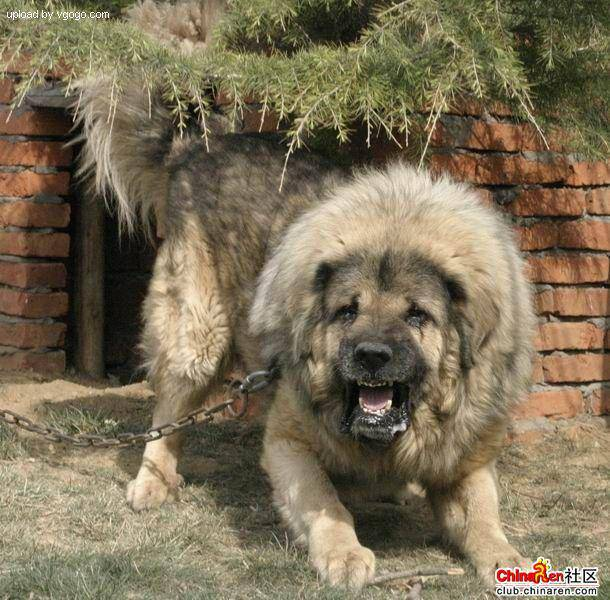

In [ ]:
Image(filenames[9000])

In [ ]:
print(filenames[9000])

/content/drive/MyDrive/Colab Notebooks/Dog_vision/train/e20e32bf114141e20a1af854ca4d0ecc.jpg


In [ ]:
data = labels["breed"].to_numpy()
print(data)
print(len(data))

['boston_bull' 'dingo' 'pekinese' ... 'airedale' 'miniature_pinscher'
 'chesapeake_bay_retriever']
10222


In [ ]:
if len(data) == len(filenames):
    print("Number of labels matches number of filenames!")
else:
    print("Number of labels does not matches number of filenames")

Number of labels matches number of filenames!


In [ ]:
import numpy as np
unique_breeds = np.unique(data)
print(len(unique_breeds))

120


In [ ]:
print(data[0])
data[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
boolean_labels = [label == unique_breeds for label in data]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Example: Turning boolean array into integers
print(np.where(unique_breeds == data[0])) #index where data occurs
print(boolean_labels[0].argmax()) #index where labels occures in boolean array
print(boolean_labels[0].astype(int)) #there will be a 1 where sample label label occurs
print(filenames[:10])

(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]
['/content/drive/MyDrive/Colab Notebooks/Dog_vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg', '/content/drive/MyDrive/Colab Notebooks/Dog_vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg', '/content/drive/MyDrive/Colab Notebooks/Dog_vision/train/001cdf01b096e06d78e9e5112d419397.jpg', '/content/drive/MyDrive/Colab Notebooks/Dog_vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg', '/content/drive/MyDrive/Colab Notebooks/Dog_vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg', '/content/drive/MyDrive/Colab Notebooks/Dog_vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg', '/content/drive/MyDrive/Colab Notebooks/Dog_vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg', '/content/drive/MyDrive/Colab Notebooks/Dog_vision/train/002a283

In [ ]:
# Setup X and Y variables
X = filenames
Y = boolean_labels

In [ ]:
# Set number of image to use experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:100, max:10000, step:1000}
print(NUM_IMAGES)

1000


In [ ]:
# Let's split our data into train and validation sets
# Split them into training and validation of total size NUM_IMAGES
from sklearn.model_selection import train_test_split
X_train,X_val, Y_train,Y_val = train_test_split(X[:NUM_IMAGES],
                                                Y[:NUM_IMAGES], test_size=0.2,
                                                random_state=42)
print(len(X_train), len(Y_train), len(X_val), len(Y_val))
print(X_train[:5], Y_train[:2])

800 800 200 200
['/content/drive/MyDrive/Colab Notebooks/Dog_vision/train/00bee065dcec471f26394855c5c2f3de.jpg', '/content/drive/MyDrive/Colab Notebooks/Dog_vision/train/0d2f9e12a2611d911d91a339074c8154.jpg', '/content/drive/MyDrive/Colab Notebooks/Dog_vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg', '/content/drive/MyDrive/Colab Notebooks/Dog_vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg', '/content/drive/MyDrive/Colab Notebooks/Dog_vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'] [array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False

To preprocess our image into tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable , 'image'
3. Turn our 'image' (a jpg) into tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1).
5. Resize the 'image' to be shape of(224, 224)
6. Return the modified 'image'

In [ ]:
# Convert image to Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
print(image.shape)
print(image.max())
print(image.min())


(257, 350, 3)
255
0


In [ ]:
# Turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
# Define image size
IMG_SIZE = 224
def process_image(image_path, img_size=IMG_SIZE):
    """
     Takes an image file path and turns the image into a Tensor.
     """
    # Read an image file
    image = tf.io.read_file(image_path)
    # Turn the jpeg image into numericals Tensor with 3 colour channels (Red, Green, Blue)
    image = tf.image.decode_jpeg(image, channels = 3)
    #convert the colour channels value from 0-225 to 0-1 values
    image = tf.image.convert_image_dtype(image, tf.float32)
    # Resize the image to our desired value(224, 224)
    image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
    return image

In [ ]:
tensor = tf.io.read_file(filenames[26])
print(tensor)

tf.Tensor(b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\xf4\x01w\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca\xd2\xd3\xd4\xd5\xd6\xd7\xd8\xd9

In [ ]:
tf.image.decode_jpeg(tensor, channels=3)[:2]

<tf.Tensor: shape=(2, 375, 3), dtype=uint8, numpy=
array([[[ 59,  68,  65],
        [ 64,  73,  70],
        [ 71,  80,  77],
        ...,
        [115, 128, 108],
        [115, 128, 108],
        [110, 123, 103]],

       [[ 65,  74,  71],
        [ 72,  81,  78],
        [ 79,  88,  85],
        ...,
        [114, 127, 107],
        [117, 130, 110],
        [116, 129, 109]]], dtype=uint8)>

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
    """Takes an image file path name and the assosciated label,
    process the image and returns a type of (image, label)."""
    image = process_image(image_path)
    return image, label

# Demo of the above
print(process_image(X[42]), tf.constant(Y[42]))

tf.Tensor(
[[[0.3264178  0.5222886  0.3232816 ]
  [0.2537167  0.44366494 0.24117757]
  [0.25699762 0.4467087  0.23893751]
  ...
  [0.29325107 0.5189916  0.3215547 ]
  [0.29721776 0.52466875 0.33030328]
  [0.2948505  0.5223015  0.33406618]]

 [[0.25903144 0.4537807  0.27294815]
  [0.24375686 0.4407019  0.2554778 ]
  [0.2838985  0.47213382 0.28298813]
  ...
  [0.2785345  0.5027992  0.31004712]
  [0.28428748 0.5108719  0.32523635]
  [0.28821915 0.5148036  0.32916805]]

 [[0.20941195 0.40692952 0.25792548]
  [0.24045378 0.43900946 0.2868911 ]
  [0.29001117 0.47937486 0.32247734]
  ...
  [0.26074055 0.48414773 0.30125174]
  [0.27101526 0.49454468 0.32096273]
  [0.27939945 0.5029289  0.32934693]]

 ...

 [[0.00634795 0.03442048 0.0258106 ]
  [0.01408936 0.04459917 0.0301715 ]
  [0.01385712 0.04856448 0.02839671]
  ...
  [0.4220516  0.39761978 0.21622123]
  [0.47932503 0.45370543 0.2696505 ]
  [0.48181024 0.45828083 0.27004552]]

 [[0.00222061 0.02262166 0.03176915]
  [0.01008397 0.03669046 0

In [ ]:
BATCH_SIZE = 32
X_train_processed = tf.data.Dataset.from_tensor_slices(X_train).map(process_image).batch(BATCH_SIZE)
X_val_processed = tf.data.Dataset.from_tensor_slices(X_val).map(process_image).batch(BATCH_SIZE)
train_data = tf.data.Dataset.zip((X_train_processed, tf.data.Dataset.from_tensor_slices(Y_train)))
val_data = tf.data.Dataset.zip((X_val_processed, tf.data.Dataset.from_tensor_slices(Y_val)))

In [ ]:
# Create a function to turn data into batches
def create_data_batches(X, Y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
    """
    Create batches of data out of image (X) and label (Y) pairs.
    Shuffles the data if it's training data but doesn't shuffle if it's validation data.
    Also accepts test data as input (no labels ).
    """
    # If the data is a test dataset, we probably don't have labels
    if test_data:
        print("Creating test data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
        data_batch = data.map(process_image).batch(BATCH_SIZE)
        return data_batch

    # If data is valid dataset, we don't need to shuffle it
    elif valid_data:
        print("Creating validation data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepath
                                                   tf.constant(Y))) # labels
        data_batch = data.map(get_image_label).batch(BATCH_SIZE)
        return data_batch

    else:
        print("Creating training data batches...")
        # Turn filepaths and labels into Tensors
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                                   tf.constant(Y)))
        # Shuffling pathnames and labels before mapping image processor function is faster than shuffling image
        data = data.shuffle(buffer_size=len(X))

        # Create (image, label) tuples (this also turns the image into preprocessed image)
        data = data.map(get_image_label)

        # Turn the training data into batches
        data_batch = data.batch(BATCH_SIZE)
    return data_batch


In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, Y_train)
val_data = create_data_batches(X_val, Y_val, valid_data=True)

# Check out the different attributes of our data batches
print(train_data.element_spec, val_data.element_spec)


Creating training data batches...
Creating validation data batches...
(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)) (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>
32 32


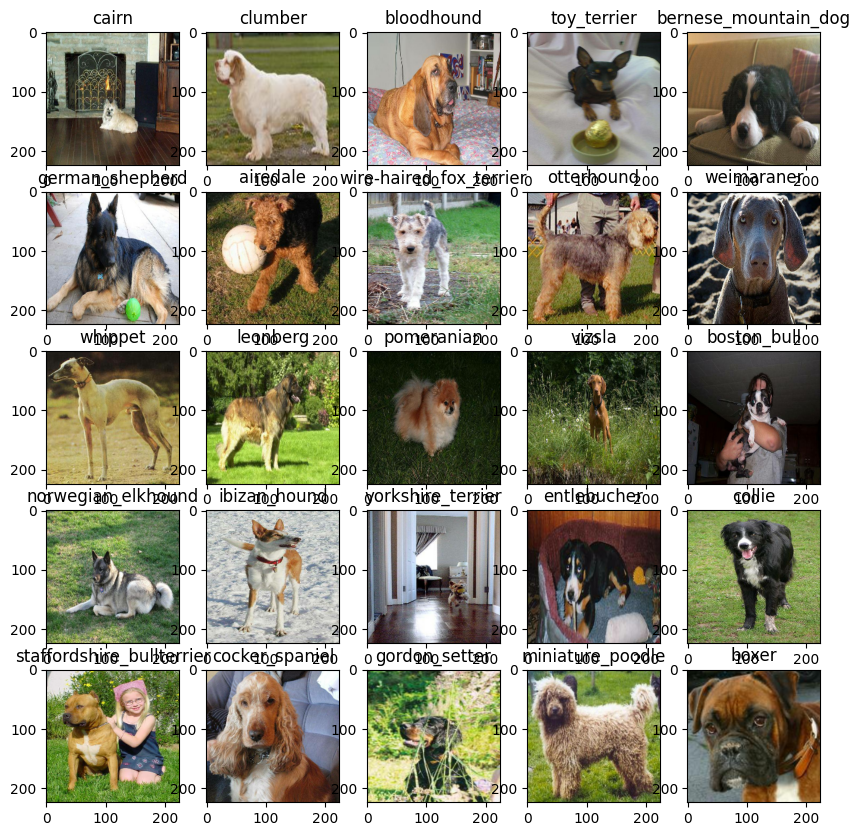

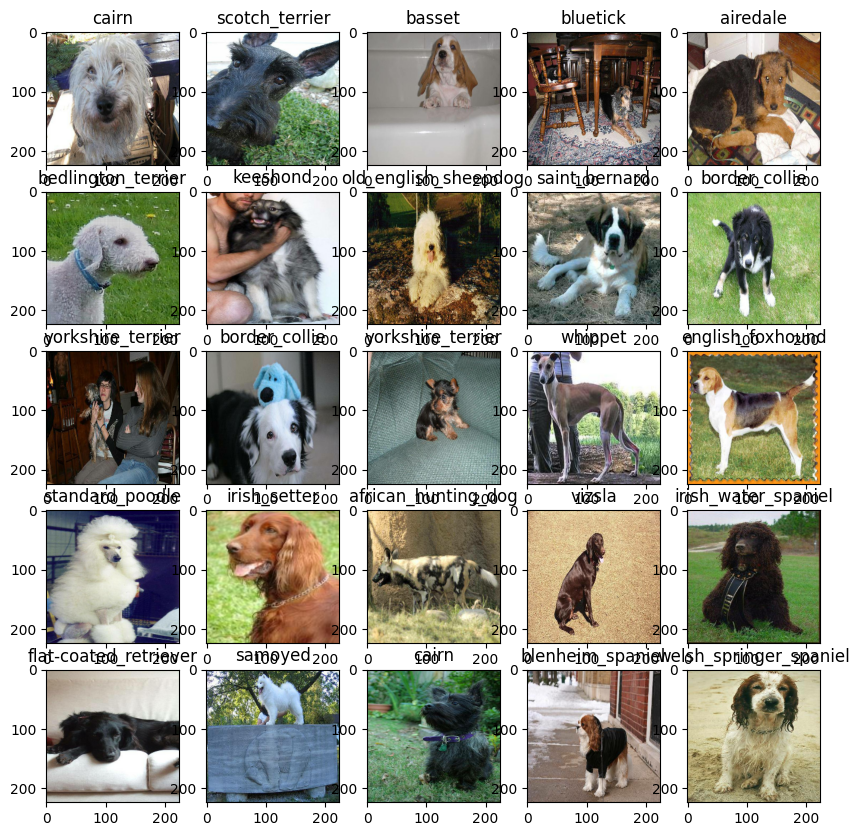

In [ ]:
def show_25_images(images, labels):
    """
    Display a plot of 25 images and their labels from data batch.
    """
    # Setup the figure
    plt.figure(figsize=(10, 10))
    # Loop through 25 (for displaying 25 images)
    for i in range(25):
        # Create subplots (5rows, 5columns)
        ax = plt.subplot(5, 5, i+1)
        # Display an image
        plt.imshow(images[i], cmap="gray")
        # Add the image label as the title
        plt.title(unique_breeds[labels[i].argmax()])
        # Turn the grid lines off
        #plt.axis("off")
print(train_data)
train_images, train_labels = next(train_data.as_numpy_iterator())
print(len(train_images), len(train_labels))

# Now let's visualize the data in a training batch
show_25_images(train_images, train_labels)

# Now let's visualize the data in training batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)
# plt.show()

In [ ]:
IMG_SIZE = 224

In [ ]:
# Constants for model creation
INPUT_SHAPE = (IMG_SIZE,IMG_SIZE, 3)
OUTPUT_SHAPE = 120
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/classification/4"


def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    print("Building model with:", model_url)

    # Define input layer
    inputs = tf.keras.Input(shape=input_shape)

    # Pass input through the hub layer
    layer = hub.KerasLayer(model_url, input_shape=input_shape)
    print("Layer type:", type(layer))
    model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=INPUT_SHAPE),  # Add input layer
        tf.keras.layers.Lambda(lambda x: hub.KerasLayer(model_url, output_shape=[1001], trainable=False)(x)),
        # Wrap KerasLayer in Lambda
        tf.keras.layers.Dense(units=output_shape, activation="softmax")
    ])

    # Add the output layer
    outputs = tf.keras.layers.Dense(units=output_shape, activation="softmax")

    # Create the model
    # model = tf.keras.Model(inputs=inputs, outputs=outputs)

    # Compile the model
    model.compile(
        loss=tf.keras.losses.categorical_crossentropy,
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )

    return model

# Create the model
model = create_model()
# Fit the model (add your training data here)
# model.fit(X_train, y_train, validation_data=(X_val, y_val), callbacks=[early_stopping], epochs=50)

# Print model summary
model = create_model()
print(model.summary())

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/classification/4
Layer type: <class 'tensorflow_hub.keras_layer.KerasLayer'>


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/input_layer.py:26: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/classification/4
Layer type: <class 'tensorflow_hub.keras_layer.KerasLayer'>


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lambda_1 (Lambda)                    │ (None, 1001)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 120)                 │         120,240 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 120,240 (469.69 KB)

 Trainable params: 120,240 (469.69 KB)

 Non-trainable params: 0 (0.00 B)

None


In [ ]:
import datetime
def create_tensorboard_callback():
    # Create a log directory for storing TensorBoard logs
    logdir = os.path.join("/content/drive/MyDrive/Colab Notebooks/Dog_vision/logs",
                          # Make it so the logs get tracked whenever we run an experiment
                           datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    return tf.keras.callbacks.TensorBoard(logdir)

# Create early stoping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "Val_accuracy",
                                                 patience=3, mode="max", verbose=1)


In [ ]:
print("GPU", "available(yesss!!!!!!)" if tf.config.list_physical_devices("GPU") else "not found")


GPU available(yesss!!!!!!)


In [ ]:
NUM_EPOCHS = 10 # @param {type:"slider", min:10, max:100}

In [ ]:
def train_model():
    """Trains a given model and returns the trained version."""
    # Create a model
    model = create_model()
    # Create new TensorBoard session everytime we train a model
    tensorboard = create_tensorboard_callback()

    # Convert boolean labels to numerical labels
    Y_train_numerical = [label.argmax() for label in Y_train]
    Y_val_numerical = [label.argmax() for label in Y_val]

    # One-hot encode the labels
    Y_train_encoded = tf.one_hot(Y_train_numerical, depth=len(unique_breeds))
    Y_val_encoded = tf.one_hot(Y_val_numerical, depth=len(unique_breeds))

    # Creating training and validation datasets
    train_data = tf.data.Dataset.from_tensor_slices((X_train, Y_train_encoded)) \
        .map(get_image_label) \
        .batch(BATCH_SIZE, drop_remainder=True) \
        .prefetch(tf.data.AUTOTUNE)

    val_data = tf.data.Dataset.from_tensor_slices((X_val, Y_val_encoded)) \
        .map(get_image_label) \
        .batch(BATCH_SIZE) \
        .prefetch(tf.data.AUTOTUNE)

    # Fit a model to the data passing it the callbacks we created
    model.fit(x=train_data, epochs=NUM_EPOCHS, validation_data=val_data,
              validation_freq=1, callbacks=[tensorboard, early_stopping])
    # Return the fitted model
    return model

model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/classification/4
Layer type: <class 'tensorflow_hub.keras_layer.KerasLayer'>
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 201s 7s/step - accuracy: 0.0510 - loss: 5.1060 - val_accuracy: 0.2900 - val_loss: 3.1978
Epoch 2/10


/usr/local/lib/python3.10/dist-packages/keras/src/callbacks/early_stopping.py:155: UserWarning: Early stopping conditioned on metric `Val_accuracy` which is not available. Available metrics are: accuracy,loss,val_accuracy,val_loss
  current = self.get_monitor_value(logs)


25/25 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - accuracy: 0.7463 - loss: 1.4721 - val_accuracy: 0.5400 - val_loss: 1.9861
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 168ms/step - accuracy: 0.9670 - loss: 0.4676 - val_accuracy: 0.6400 - val_loss: 1.5750
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 182ms/step - accuracy: 0.9887 - loss: 0.2079 - val_accuracy: 0.6750 - val_loss: 1.4373
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 170ms/step - accuracy: 0.9990 - loss: 0.1236 - val_accuracy: 0.6900 - val_loss: 1.3718
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - accuracy: 1.0000 - loss: 0.0869 - val_accuracy: 0.6900 - val_loss: 1.3315
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 167ms/step - accuracy: 1.0000 - loss: 0.0661 - val_accuracy: 0.6900 - val_loss: 1.3038
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 170ms/step - accuracy: 1.0000 - loss: 0.0527 - val_accuracy: 0.7100 - val_loss: 1.2831
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 192ms/step - accuracy: 1.0000 - loss: 0.0435 - val_accuracy: 0.7150 - val

# **Checking the TensorBoard logs**

The TensorBoard magic function (%tensorboard) will access the logs directory we created we earlier and visualize its contents.


In [ ]:
%load_ext tensorboard
%tensorboard --logdir  /content/Dog_vision/Logs

<IPython.core.display.Javascript object>

# Making and evaluating predictions using a trained model


In [ ]:
# Make prediction on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
print(predictions)

7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 604ms/step
[[5.7410647e-04 5.3331512e-04 2.1044457e-04 ... 6.1564968e-04
  2.8208928e-04 4.6339403e-03]
 [2.4221174e-03 3.1194636e-03 3.5000246e-02 ... 4.8446830e-04
  3.7313107e-02 2.2242628e-05]
 [8.8242068e-06 3.8402359e-05 3.8440962e-04 ... 1.2853240e-04
  8.7910412e-05 4.3139867e-03]
 ...
 [5.0504073e-05 1.3384677e-04 9.1683258e-05 ... 6.7524255e-05
  3.7782051e-04 1.3789182e-04]
 [1.2061188e-03 1.4144635e-04 3.2067746e-05 ... 3.0032923e-05
  1.2246323e-04 1.5412364e-02]
 [1.4798601e-04 5.9091719e-05 5.6420680e-04 ... 1.2338633e-02
  1.0209861e-03 8.0356916e-04]]


In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(Y_val)

200

In [ ]:
# First prediction
index = 56
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[5.39222034e-03 2.29870875e-05 6.34421769e-04 4.27275845e-05
 1.74847769e-03 5.10276353e-04 1.06755067e-02 2.10247148e-04
 3.68005800e-04 8.38482054e-04 2.67747411e-04 2.23762559e-04
 1.56569621e-03 1.64600520e-03 2.32785664e-04 5.62134082e-04
 3.62148741e-04 6.97592258e-01 7.21689838e-04 7.18076306e-04
 5.01618255e-04 1.82462460e-03 2.47156750e-02 2.21456809e-04
 3.98693170e-04 7.15710703e-05 1.17933378e-02 5.36572770e-04
 1.92907813e-03 1.35002248e-02 3.36611120e-04 1.15128518e-04
 3.40144034e-05 2.43713940e-03 4.01748694e-04 7.16387120e-04
 3.70328227e-04 7.97177636e-05 3.85171821e-04 1.67578750e-03
 5.65667542e-05 6.00001193e-04 3.14651261e-04 3.49978625e-04
 6.39911275e-04 7.16329028e-04 1.47839208e-04 7.48372171e-04
 3.11196229e-04 7.44797217e-05 8.87688220e-05 8.53850652e-05
 2.36713793e-04 1.62548944e-03 1.06336025e-04 2.18173634e-04
 3.57298821e-04 1.32758329e-02 9.96773306e-05 8.54693120e-04
 3.04641551e-04 4.45810147e-03 9.63368730e-05 1.39123760e-03
 3.68093047e-03 9.160576

Having the above functionality is great but we want to abel to do it at scale.
And it would even better if we could see the image the prediction is being made on

**Note:**prediction probablities are known as confidence levels.

In [ ]:
#  Turn prediction probablities into their respective label(easier to understand)
def get_pred_label(prediction_probabilities):
  """Turns an array of prediction probablities into a label"""
  return unique_breeds[np.argmax(prediction_probabilities)]
# Get a predicted label based on an array of prediction probablities
pred_label =get_pred_label(predictions[6])
pred_label

'keeshond'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then comapare those prediction to validation labels(truth labels).

In [ ]:
# Ensure val_data is batched correctly, with a batch size like 32
val_data = val_data.batch(32)  # Replace 32 with an appropriate batch size

In [ ]:
print(len(val_images))
# get_pred_label(val_images[6])

32


Now we've got ways to get:
*   Validation labels(truth labels)
*   Prediction labels
*   Validation images

Let's make some function to make these all a bit more visualize.

We'll create a function which:

*   Takes an array of predicted probababilities, an array of truth labels and an array of images and integers.
*   Convert the prediction probablities to predicted label.
*   Plot the predicted label,its predicted probablity,the truth label and the target imgage on a single plot.



In [ ]:
# def unbatchify(data):
#   """
#   Takes a batched dataset of (image, labels) Tensors and returns separate arrays
#   of images and labels
#   """
#   images = []
#   labels = []
#   # Loop through unbatched data
#   for image, label in data.unbatch().as_numpy_iterator():
#     images.append(image)
#     labels.append(unique_breeds[np.argmax(label)])
#   return images, labels # Return outside the loop to process all element
# # Assuming 'val_data' is your batched dataset:
# val_images, val_labels = unbatchify(val_data)
# print(len(val_images), len(val_labels))  # Check the length to verify if all images are unbatchified

In [ ]:
tf.config.run_functions_eagerly(True)  # Enable eager execution

def unbatchify(data):
  """
  Takes a batched dataset of (image, labels) Tensors
  and returns separate arrays of images and labels.
  """
  images = []
  labels = []

  for element in data:  # Iterate through the batched dataset
    image, label = element  # Unpack the image and label

    # Convert to NumPy and append
    images.append(image.numpy())
    labels.append(unique_breeds[np.argmax(label.numpy())])

  return images, labels
val_images, val_labels = unbatchify(val_data)
print(len(val_images), len(val_labels))

InvalidArgumentError: {{function_node __wrapped__IteratorGetNext_output_types_2_device_/job:localhost/replica:0/task:0/device:CPU:0}} Cannot batch tensors with different shapes in component 0. First element had shape [32,224,224,3] and element 6 had shape [8,224,224,3]. [Op:IteratorGetNext] name: 

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=0):
    """View the prediction, ground truth, and image for each sample in the dataset."""
    min_length = min(len(prediction_probabilities), len(labels), len(images))

    for n in range(min_length):
        # Fetch data for the current sample
        pred_prob = prediction_probabilities[n]
        true_label = labels[n]
        image = images[n]  # Check that `images` contains valid image data

        # Get the predicted label for this image
        pred_label = get_pred_label(pred_prob)

        # Plot the image and remove ticks
        plt.imshow(image)
        plt.xticks([])
        plt.yticks([])

        # Change title color based on prediction correctness
        color = "green" if pred_label == true_label else "red"

        # Set plot title with prediction info and true label
        plt.title(f"{pred_label}, {np.max(pred_prob) * 100:.2f}% confidence (True: {true_label})", color=color)

        # Display the plot
        plt.show()


In [ ]:
print(f"Number of predictions: {len(predictions)}")
print(f"Number of labels: {len(val_labels)}")
print(f"Number of images: {len(val_images)}")


Number of predictions: 200
Number of labels: 32
Number of images: 32


In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=0):
    """View the prediction, ground truth, and image for sample at index n"""
    # Check if n is within the range
    if n >= len(prediction_probabilities) or n >= len(labels) or n >= len(images):
        print(f"Index {n} is out of range. Please provide an index within the dataset size.")
        return

    # Fetch data for the current sample
    pred_prob = prediction_probabilities[n]
    true_label = labels[n]
    image = images[n]

    # Get the predicted label for this image
    pred_label = get_pred_label(pred_prob)

    # Plot the image and remove ticks
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    # Change title color based on prediction correctness
    color = "red" if pred_label == true_label[0] else "green"

    # Set plot title with prediction info and true label
    plt.title(f"{pred_label}, {np.max(pred_prob) * 100:.2f}%",color =color)

    # Display the plot
    plt.show()


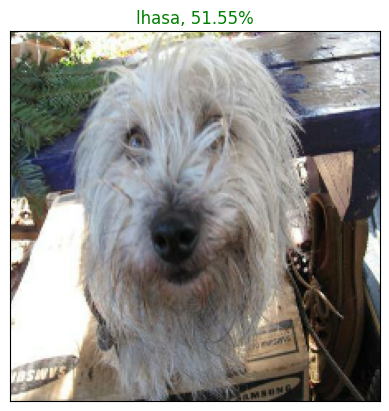

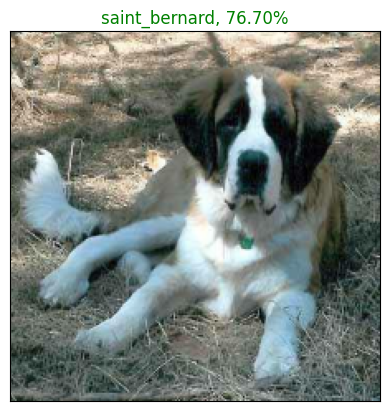

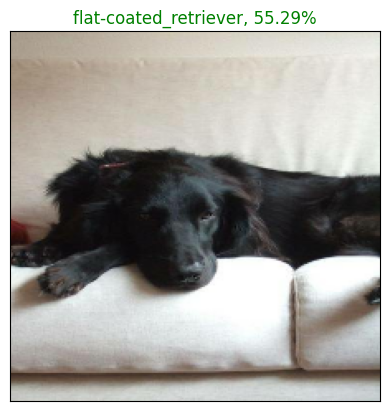

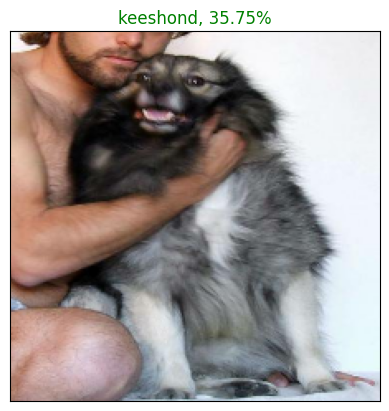

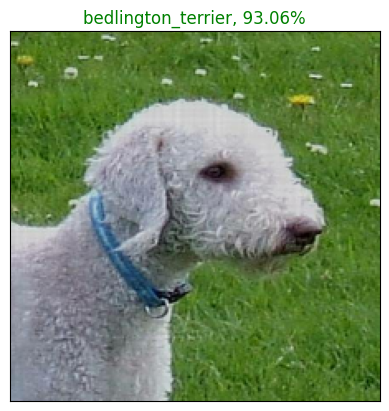

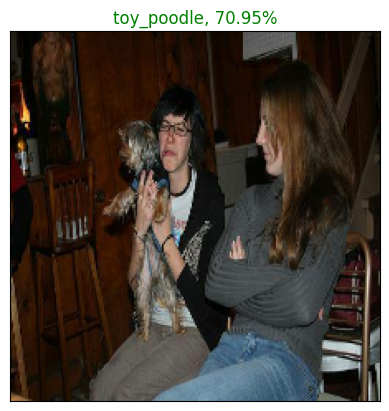

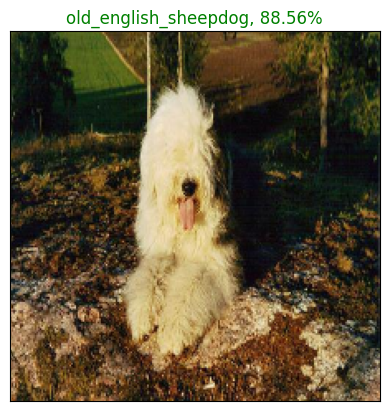

In [ ]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=0)
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=8)
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=20)
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=6)
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=5)
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=10)
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=7)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions


*   Take an input of prediction array and a ground truth array and an integer
*   Find the prediction using get_pred_label()


*   Find the top 10:


      *   prediction probabilities indexs
      *   prediction probabilities values
      *   prediction labels

 *   Plot the top 10 prediction probability values and labels, coloring the true label green









In [ ]:
def plot_pred_conf(predictions_probabilities, labels, n=1):
    """
    Plot the top 10 highest prediction confidences along with the truth label for sample n.
    """
    pred_prob, true_label = predictions_probabilities[n],labels[n]

    # Get the predicted label
    pred_label = get_pred_label(pred_prob)

    # Find the top 10 prediction confidence indexs
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
    # Find the top 10 prediction confidence values
    top_10_pred_values = pred_prob[top_10_pred_indexes]
    # Find the top prediction labels
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]

    # Setup plot
    top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                       top_10_pred_values, color = "grey")
    plt.xticks(np.arange(len(top_10_pred_labels)),
               labels = top_10_pred_labels, rotation ="vertical")

    # Change the color of true label
    if np.isin(true_label[0], top_10_pred_labels):
      top_plot[np.argmax(top_10_pred_labels == true_label[0])[0][0]].set_color("green")
    else:
      pass


In [ ]:
plot_pred_conf(predictions_probabilities=predictions, labels=val_labels, n=31)

Now we've got some function to helps us to visualize our predictions and evaluate our model,let's check out a few

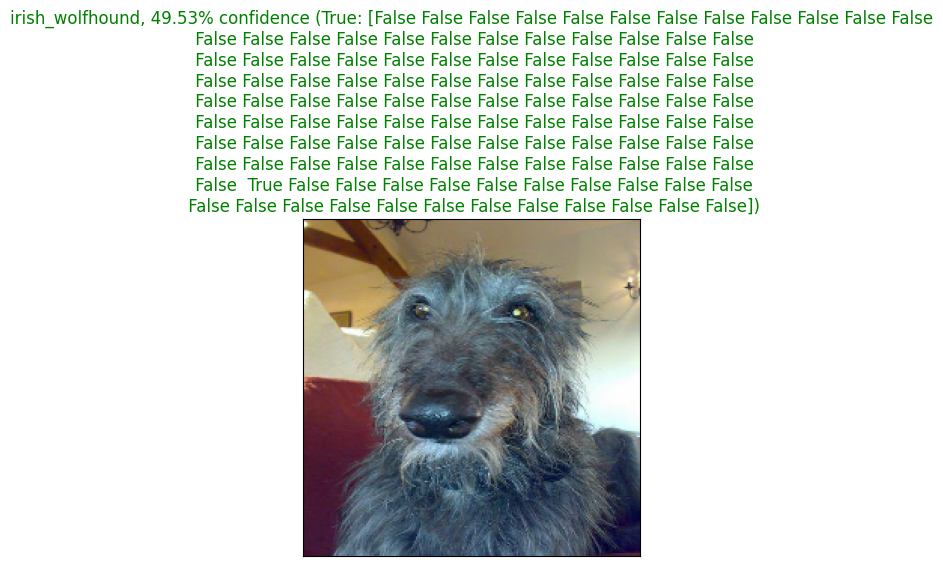

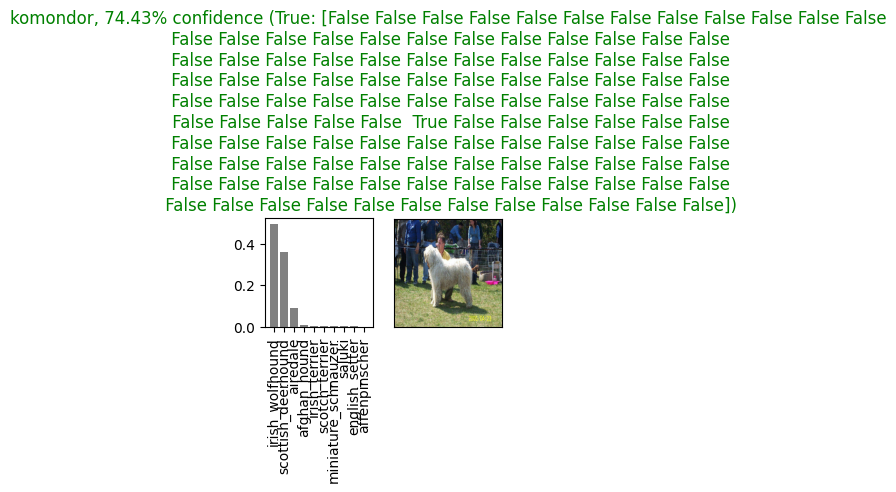

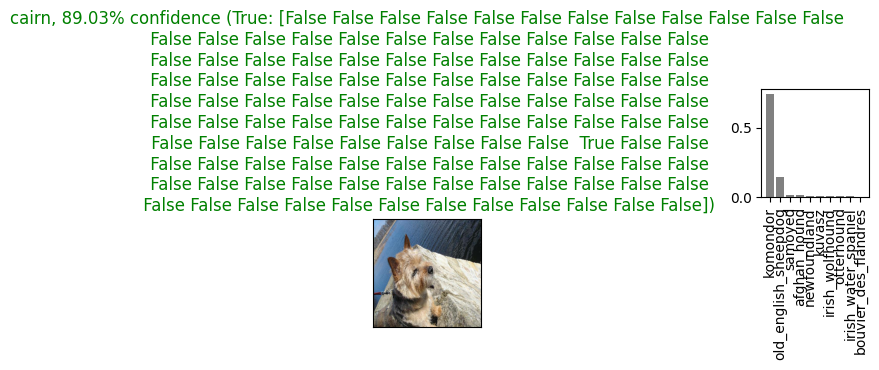

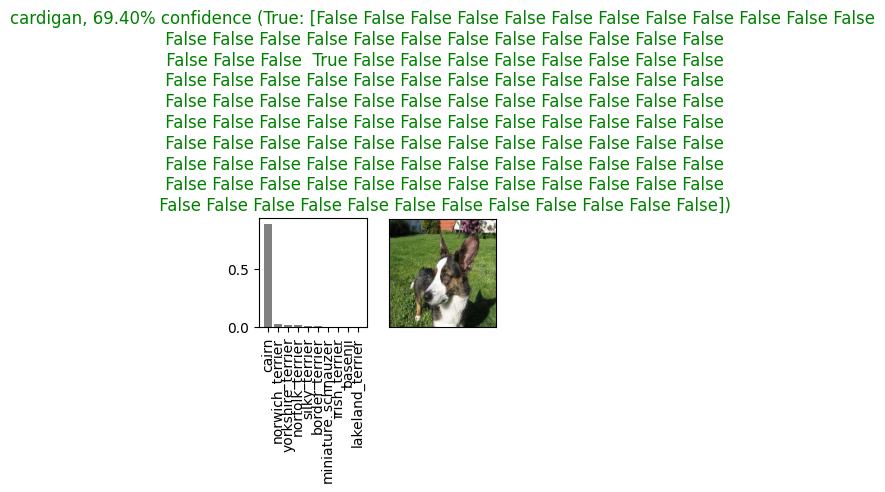

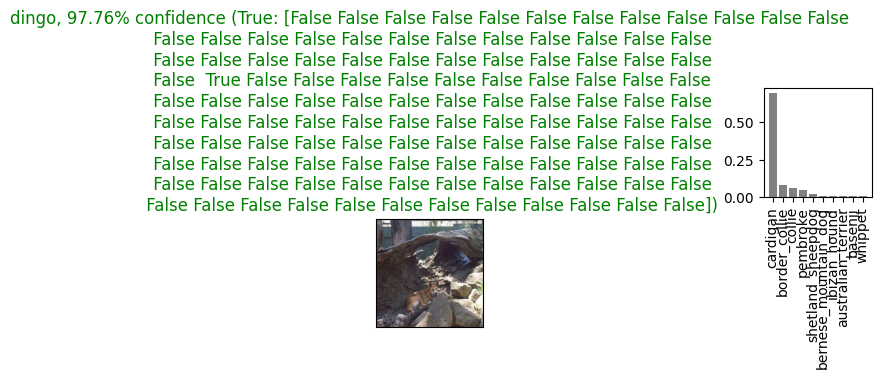

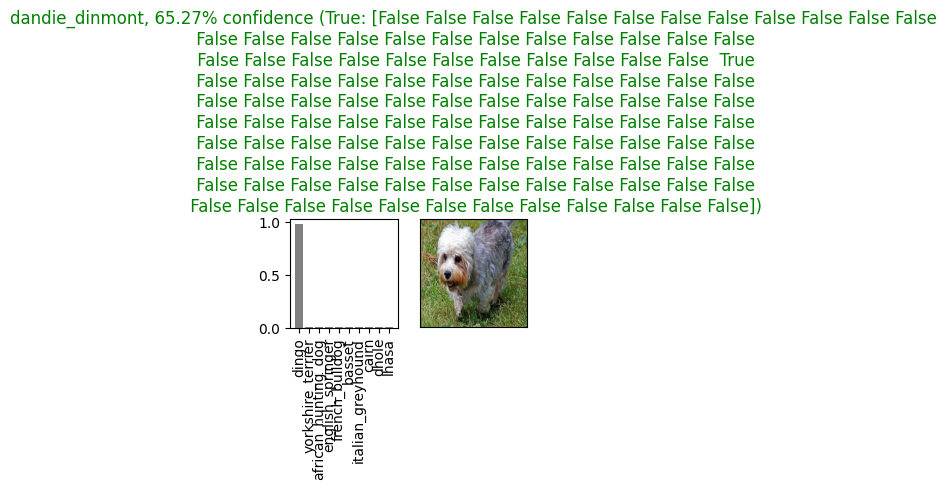

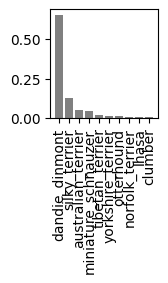

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 25
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions, labels=val_labels,
            images = val_images, n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions_probabilities=predictions, labels=val_labels, n=i+i_multiplier)
  # plt.tight_layout(h_pad=1.0)
plt.show()

**Challenge:** How would you create a confusion matrix with our models prediction and true labels?

## Saving and relaoding a model

In [ ]:
 # Create a function to save a model
def save_model(model, suffix=None):
  """Saves a given model in a models directory and append a suffix (string)."""

  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Colab Notebooks/Dog_vision/Models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """ Loads a saved model from a specified path."""
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"Keraslayer":hub.KerasLayer})
  return model


Now we've got function to save and load a trained model, let's make sure they work

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix = "1000-images-mobilenetv2-Adam")

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model("/content/drive/MyDrive/Colab Notebooks/Dog_vision/Models/20241031-11281730374128-1000-images-mobilenetv2-Adam.h5")


In [ ]:
model.evaluate(val_data)
# model.evaluate(val_data)

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

## Training a big dog model (on the  full data)

In [ ]:
len(X), len(Y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, Y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/classification/4
Layer type: <class 'tensorflow_hub.keras_layer.KerasLayer'>


**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory

## Making prediction on test dataset
Since our model has been trained on images in the form of Tensor batches, to make prediction on the test data, we'll have to get it into the same formate

Luckily we created 'created_data_batches() earlier which can take a list of filenames as input and convert into Tensor batches.
  

*   Get the test image filenames
*   Convert the filenames into test data batches using 'create_data_batches() and setting the 'test_data' parameters to 'True' (since the test doesn't have labels)


*   make a prediction array by passing the test batches to predict() method called on our model.





In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Colab Notebooks/Dog_vision/test"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Colab Notebooks/Dog_vision/test000621fb3cbb32d8935728e48679680e.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_vision/test0036c6bcec6031be9e62a257b1c3c442.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_vision/test00225dcd3e4d2410dd53239f95c0352f.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_vision/test001a5f3114548acdefa3d4da05474c2e.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_vision/test0012a730dfa437f5f3613fb75efcd4ce.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_vision/test001510bc8570bbeee98c8d80c8a95ec1.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_vision/test00102ee9d8eb90812350685311fe5890.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_vision/test002c2a3117c2193b4d26400ce431eebd.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_vision/test002c58d413a521ae8d1a5daeb35fc803.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_vision/test002f80396f1e3db687c5932d7978b196.jpg']

In [ ]:
len(test_filenames)

723

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


**Note:** Calling 'predict()' on our full model and passing it the test data batch will take long time to run (about an ~1hr)

## Preparing test dataset prediction for kaggle
Looking at the kaggle sample submission, we find that it wants our models prediction probablity outputs in a DataFrame an ID and a column for each different dog breed.
htttps://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this formate, we'll:


*  Create a pandas DataFrame with and ID column as well as a column for each dog breed.
*   Add data to ID column by extracting the test image ID's from their filepaths.


*   Add data (prediction probabilities) to each of the dog breed columns.
*   Export the DataFrame as a CSV to submit it to kaggle.






In [ ]:
# ["id"]+list(unique_breeds)

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()


,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to prediction DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0036c6bcec6031be9e62a257b1c3c442,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,00225dcd3e4d2410dd53239f95c0352f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,001a5f3114548acdefa3d4da05474c2e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0012a730dfa437f5f3613fb75efcd4ce,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Save our prediction dataframe to CSV for submission to kaggle
preds_df.to_csv("drive/MyDrive/Colab Notebooks/Dog_vision/full_model_predictions_submission_1_mobilenetv2.csv",
                index = False)

## Making prediction on custome images
To make prediction on custom images, we'll:
*  Get the filepaths of our own images.
*  Turn the filepaths into data batches using 'create_data_batches()' And since our custome images won't have labels, we set the 'test_data' parameter to 'True'.
*  Pass the custom image data batch to our model's 'predict()' method.
*  Convert the prediction output probablities to prediction labels.
*  Compare the prediction labels to the custome images.

In [ ]:
# Get custome image filepaths
import os
custome_path = "drive/MyDrive/Colab Notebooks/Dog_vision/custome_images/"
custome_images_paths = [custome_path + fname for fname in os.listdir(custome_path)]

In [ ]:
custome_images_paths

['drive/MyDrive/Colab Notebooks/Dog_vision/custome_images/WhatsApp Image 2024-09-11 at 17.04.23_2dc23716.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_vision/custome_images/WhatsApp Image 2024-09-11 at 17.04.37_46194269.jpg',
 'drive/MyDrive/Colab Notebooks/Dog_vision/custome_images/.ipynb_checkpoints']

In [ ]:
# Check custome prediction
plt.figure(figsize=(10,10))
for i, image in enumerate(custome_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(f"Prediction: {custome_preds_labels[i]}")
  plt.imshow(image)

<Figure size 1000x1000 with 0 Axes>